In [1]:
import torch 
import torch.nn as nn
import torch.optim as optim

import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.transforms.functional as F

from torchvision.utils import save_image
from torch.utils.data import DataLoader

import numpy as np

import matplotlib.pyplot as plt

In [2]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

cuda


In [3]:
lr = 5e-4 #vary 
z_dim = 100 #vary
img_dim = 64
channels_img = 3
batch_size = 64
num_epochs = 50

critic_iter = 5
weight_clip = 0.01

In [4]:
class Critic(nn.Module):
    def __init__(self, channels):
        super(Critic, self).__init__()
        
        self.critic = nn.Sequential(
            nn.Conv2d(channels, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
            #No Sigmoid here
        )

    def forward(self, x):
        return self.critic(x)
    
class Generator_DCGAN(nn.Module):
    def __init__(self, noise_dim, channels):
        super(Generator_DCGAN, self).__init__()
        
        self.gen = nn.Sequential(
            nn.ConvTranspose2d(noise_dim, 1024, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(1024),
            nn.ReLU(True),

            nn.ConvTranspose2d(1024, 512, kernel_size=4,stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )
    
    def forward(self, x):
        return self.gen(x)
    
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m , (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)

In [5]:
transforms = transforms.Compose(
    [
        transforms.Resize(img_dim),
        transforms.CenterCrop(img_dim),# Required as Images are of different size
        transforms.ToTensor(),
        transforms.Normalize([0.5 for _ in range(channels_img)],[0.5 for _ in range(channels_img)]),     
    ]
) 

In [6]:
dataset = datasets.ImageFolder(root="/kaggle/input/", transform = transforms)
loader = DataLoader(dataset, batch_size=batch_size, shuffle = True)

In [7]:
critic = Critic(channels_img).to(device)
gen = Generator_DCGAN(z_dim, channels_img).to(device)

In [8]:
initialize_weights(critic)
initialize_weights(gen)

opt_critic = optim.RMSprop(critic.parameters(), lr = lr)
opt_gen = optim.RMSprop(gen.parameters(), lr = lr)

In [9]:
fixed_noise = torch.randn((32, z_dim, 1, 1)).to(device)

In [10]:
def generate_img(generator, fixed_noise, channels, img_dim):
    
    fake = generator(fixed_noise).reshape(-1, channels, img_dim, img_dim)
    img_grid = torchvision.utils.make_grid(fake, normalize=True)
    return img_grid

def generate_interpolation(generator, z_dim, channels, img_dim):

    point_1 = torch.randn((1, z_dim, 1, 1)).to(device)
    point_2 = torch.randn((1, z_dim, 1, 1)).to(device)

    interpolated = point_1.detach().clone()
    for i in range(1, 16, 1):
        inter = torch.lerp(point_1, point_2,(i/15.0)).to(device)
        interpolated = torch.cat((interpolated, inter), 0).to(device)
        
    imgs = gen(interpolated).reshape(-1, channels_img, img_dim, img_dim)
    img_grid = torchvision.utils.make_grid(imgs, normalize=True)
    return img_grid

def show_grid(imgs): #Show function from documentation
    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])

In [11]:
def train_critic(real_img, fake_img, optim, critic):

    optim.zero_grad()

    # Train Critic Max E[critic(real)] - E[critic(fake)]

    critic_real = critic(real_img).reshape(-1)
    critic_fake = critic(fake_img).reshape(-1)

    loss_critic =  torch.mean(critic_fake) - torch.mean(critic_real)

    loss_critic.backward()
    
    optim.step()

    return loss_critic

def train_gen(fake_img, optim, critic):

    optim.zero_grad()
    
    # Train Gen Min -E[critic(fake)]

    output = critic(fake_img).reshape(-1)
    
    loss_gen = -torch.mean(output)

    loss_gen.backward()

    optim.step()

    return loss_gen

Epoch [0/50] Batch 0/994 Discriminator loss: -0.2356, Generator loss: 0.3088
Epoch [1/50] Batch 0/994 Discriminator loss: -0.7502, Generator loss: 0.3892
Epoch [2/50] Batch 0/994 Discriminator loss: -0.6170, Generator loss: 0.1970
Epoch [3/50] Batch 0/994 Discriminator loss: -0.4967, Generator loss: 0.2881
Epoch [4/50] Batch 0/994 Discriminator loss: -0.4028, Generator loss: 0.4529
Epoch [5/50] Batch 0/994 Discriminator loss: -0.3816, Generator loss: 0.4540
Epoch [6/50] Batch 0/994 Discriminator loss: -0.3351, Generator loss: 0.3121
Epoch [7/50] Batch 0/994 Discriminator loss: -0.3827, Generator loss: 0.2609
Epoch [8/50] Batch 0/994 Discriminator loss: -0.3719, Generator loss: 0.3441
Epoch [9/50] Batch 0/994 Discriminator loss: -0.2900, Generator loss: 0.3208
Epoch [10/50] Batch 0/994 Discriminator loss: -0.3618, Generator loss: 0.3054
Epoch [11/50] Batch 0/994 Discriminator loss: -0.2091, Generator loss: 0.1161
Epoch [12/50] Batch 0/994 Discriminator loss: -0.3207, Generator loss: 0.0

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Epoch [21/50] Batch 0/994 Discriminator loss: -0.1456, Generator loss: 0.2391
Epoch [22/50] Batch 0/994 Discriminator loss: -0.2853, Generator loss: 0.2767
Epoch [23/50] Batch 0/994 Discriminator loss: -0.2358, Generator loss: 0.3521
Epoch [24/50] Batch 0/994 Discriminator loss: -0.2530, Generator loss: 0.1741
Epoch [25/50] Batch 0/994 Discriminator loss: -0.2809, Generator loss: 0.2892
Epoch [26/50] Batch 0/994 Discriminator loss: -0.3141, Generator loss: 0.1907
Epoch [27/50] Batch 0/994 Discriminator loss: -0.2571, Generator loss: 0.1827
Epoch [28/50] Batch 0/994 Discriminator loss: -0.2911, Generator loss: 0.2998
Epoch [29/50] Batch 0/994 Discriminator loss: -0.3564, Generator loss: 0.2409
Epoch [30/50] Batch 0/994 Discriminator loss: -0.3445, Generator loss: 0.3843
Epoch [31/50] Batch 0/994 Discriminator loss: -0.2752, Generator loss: 0.1795
Epoch [32/50] Batch 0/994 Discriminator loss: -0.3403, Generator loss: 0.1897
Epoch [33/50] Batch 0/994 Discriminator loss: -0.1230, Generator

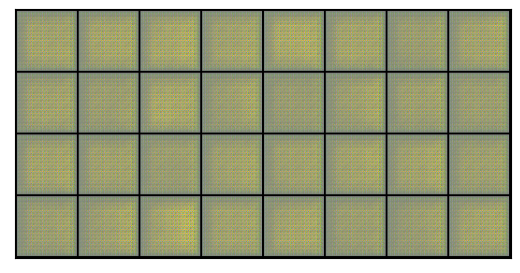

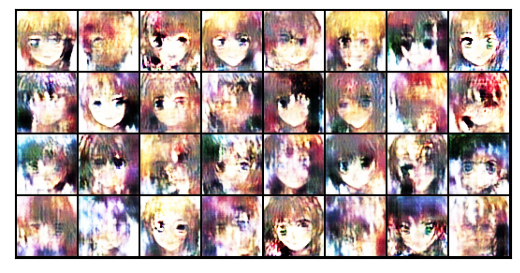

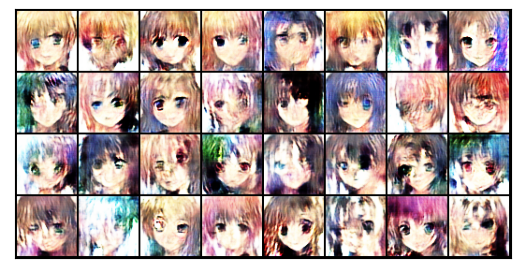

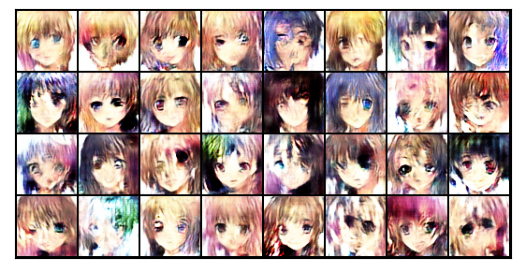

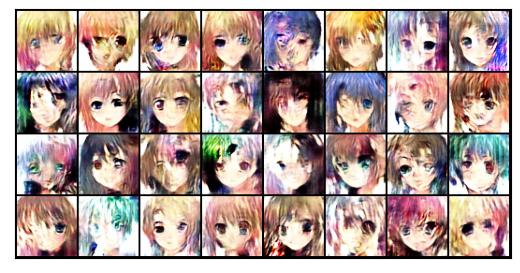

...

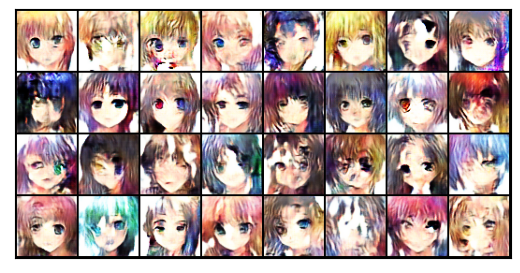

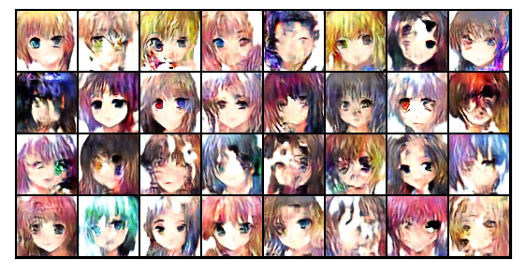

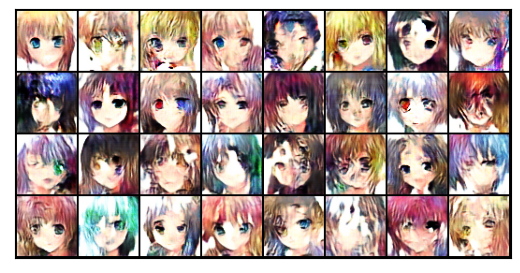

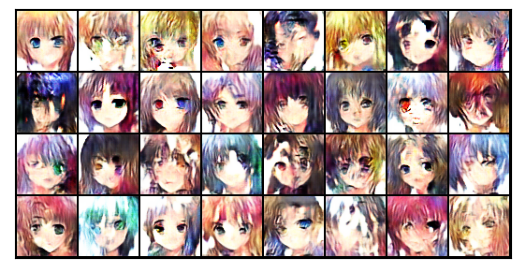

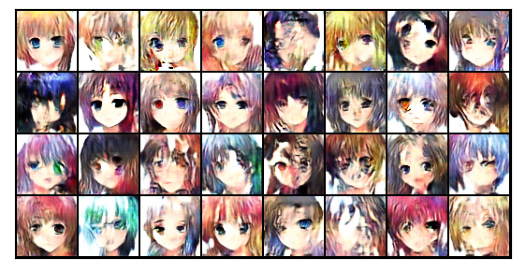

In [12]:
losses_c = []
losses_g = []

for epoch in range(num_epochs):

    loss_c = 0.0
    loss_g = 0.0

    for batch_idx, (real, _) in enumerate(loader):
        real = real.to(device)
        batch_size = real.shape[0]
        
        loss_c_batch = 0.0
        loss_g_batch = 0.0
        
        for _ in range(critic_iter):
            noise = torch.randn((batch_size, z_dim, 1, 1)).to(device)
            fake = gen(noise).detach()

            loss_c_i = train_critic(real, fake, opt_critic, critic)
            loss_c_batch = loss_c_batch + loss_c_i.detach().cpu()
            
            for para in critic.parameters():
                para.data.clamp_(-weight_clip, weight_clip)

        loss_c_batch = loss_c_batch/critic_iter 
        loss_c = loss_c + loss_c_batch

        noise = torch.randn((batch_size, z_dim, 1, 1)).to(device)
        fake = gen(noise)

        loss_g_batch = train_gen(fake, opt_gen, critic).detach().cpu()
        loss_g = loss_g + loss_g_batch
####################################################
        if (batch_idx == 0):
            print(f"Epoch [{epoch}/{num_epochs}] Batch {batch_idx}/{len(loader)} Discriminator loss: {loss_c:.4f}, Generator loss: {loss_g:.4f}")

            with torch.no_grad():
                show_grid(generate_img(gen, fixed_noise, channels_img, img_dim))
####################################################           
    loss_c = loss_c/len(loader)
    losses_c.append(loss_c)
    
    loss_g = loss_g/len(loader)
    losses_g.append(loss_g)

show_grid(generate_img(gen, fixed_noise, channels_img, img_dim))

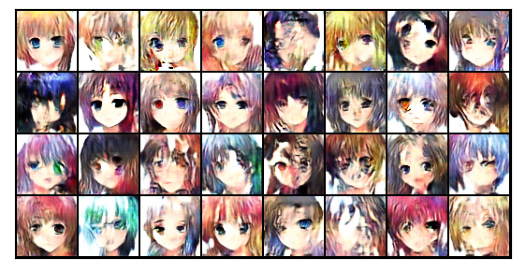

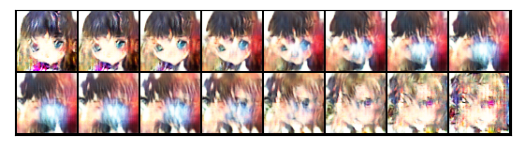

In [13]:
sample_img = generate_img(gen, fixed_noise, channels_img, img_dim)
show_grid(sample_img)
save_image(sample_img, "result.png")

interpolation_img = generate_interpolation(gen, z_dim, channels_img, img_dim)
show_grid(interpolation_img)
save_image(interpolation_img, "interpolation.png")

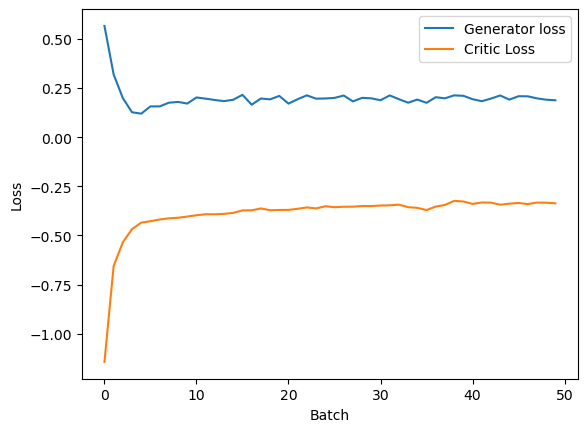

In [14]:
plt.figure()
plt.plot(losses_g, label='Generator loss')
plt.plot(losses_c, label='Critic Loss')
plt.legend()
plt.xlabel("Batch")
plt.ylabel("Loss")
plt.savefig("loss.png")
plt.show()